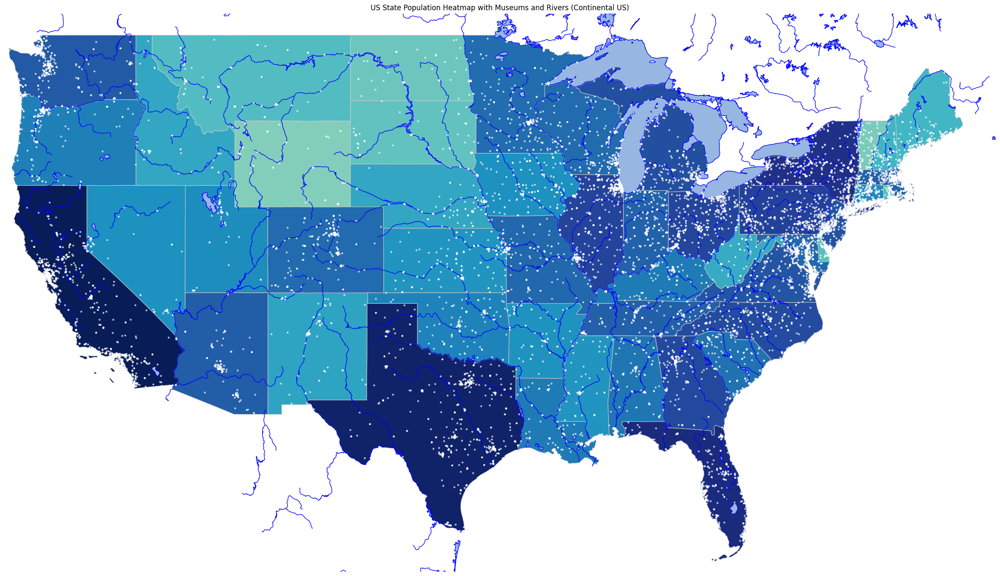

In [25]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors

# Load and filter population data
population_df = pd.read_csv('NST-EST2023-ALLDATA.csv', low_memory=False)
filtered_population_df = population_df[['NAME', 'POPESTIMATE2023']]
filtered_population_df.columns = ['State', 'Population']

# Load the US states shapefile (update the path to where your shapefile is located)
shapefile_path = 'cb_2018_us_state_20m.shp'
states_gdf = gpd.read_file(shapefile_path)

# List of continental US states (excluding Alaska, Hawaii, and territories)
continental_us_states = [
    'Alabama', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut',
    'Delaware', 'Florida', 'Georgia', 'Idaho', 'Illinois', 'Indiana', 'Iowa',
    'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts',
    'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska',
    'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
    'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon',
    'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee',
    'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia',
    'Wisconsin', 'Wyoming'
]

# Filter for only the continental US states
states_gdf = states_gdf[states_gdf['NAME'].isin(continental_us_states)]

# Merge the population data with the geometrical data
merged_gdf = states_gdf.merge(filtered_population_df, left_on='NAME', right_on='State')

# Handle zero populations by setting a minimum value for logarithmic scaling
merged_gdf['Population'] = merged_gdf['Population'].replace(0, 1)

# Load the museum data
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Drop rows with missing latitude, longitude, or revenue values
museums_df = museums_df.dropna(subset=['Latitude', 'Longitude', 'Revenue'])

# Filter out non-positive revenue values
museums_df = museums_df[museums_df['Revenue'] > 0]

# Set the size of the dots (can be adjusted as needed)
dot_size = 5

# Create a custom colormap with a better spread of colors
cmap_population = plt.colormaps['YlGnBu']

# Set the figure size to make the map balanced
fig, ax = plt.subplots(1, 1, figsize=(30, 20), subplot_kw={'projection': ccrs.PlateCarree()})

# Apply a logarithmic scale for the population data
norm_population = mcolors.LogNorm(vmin=50000, vmax=merged_gdf['Population'].max())

# Plot the merged GeoDataFrame for the heatmap
merged_gdf.plot(column='Population', cmap=cmap_population, linewidth=0.8, ax=ax, edgecolor='0.8', norm=norm_population, zorder=1)

# Overlay the museum data without adding extra map features
ax.scatter(
    museums_df['Longitude'], 
    museums_df['Latitude'], 
    color='white',  # Change the color as needed
    s=dot_size, 
    alpha=0.6, 
    transform=ccrs.PlateCarree(), 
    zorder=3
)

# Add rivers and lakes from Cartopy's built-in features
ax.add_feature(cfeature.RIVERS.with_scale('10m'), linewidth=1, edgecolor='blue', zorder=2)
ax.add_feature(cfeature.LAKES.with_scale('10m'), linewidth=1, edgecolor='blue', zorder=2)

# Adjust aspect ratio to stretch or squash the map vertically
aspect_ratio = 1.3
ax.set_aspect(aspect_ratio)

# Set the extent (geographical bounds) for the map
ax.set_extent([-125, -65, 24, 50], crs=ccrs.PlateCarree())

# Remove axes for a cleaner look
ax.axis('off')

# Add a title
plt.title('US State Population Heatmap with Museums and Rivers (Continental US)')

# Show the plot
plt.show()


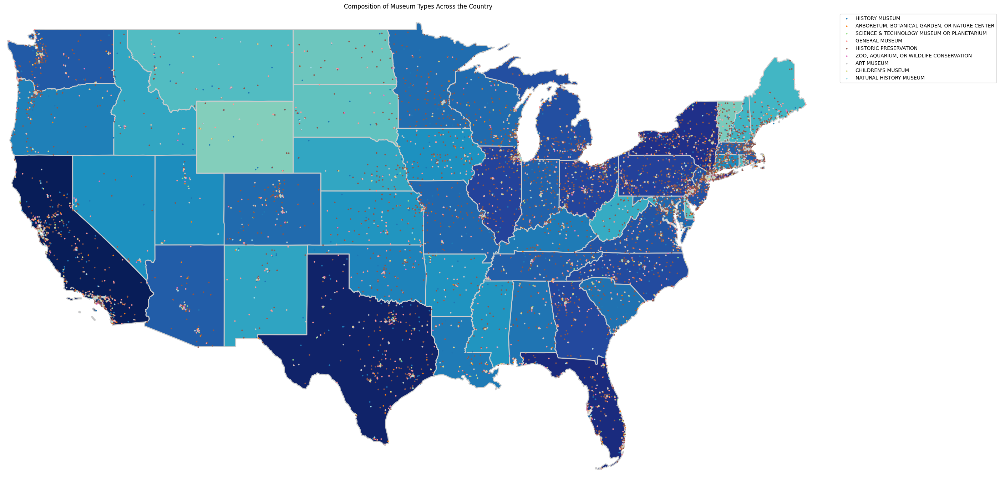

In [26]:
# Create a colormap for different museum types
unique_museum_types = museums_df['Museum Type'].unique()
cmap_museum_types = plt.get_cmap('tab20', len(unique_museum_types))



# Create a figure
fig, ax = plt.subplots(1, 1, figsize=(30, 20), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the merged GeoDataFrame for the heatmap
merged_gdf.plot(column='Population', cmap=cmap_population, linewidth=2, ax=ax, edgecolor='0.8', norm=norm_population, zorder=1)



# Overlay the museum data, colored by type
for i, museum_type in enumerate(unique_museum_types):
    subset = museums_df[museums_df['Museum Type'] == museum_type]
    ax.scatter(
        subset['Longitude'], 
        subset['Latitude'], 
        color=cmap_museum_types(i), 
        s=4, 
        alpha=1, 
        label=museum_type,
        transform=ccrs.PlateCarree(), 
        zorder=3
    )

# Add rivers and lakes from Cartopy's built-in features
# ax.add_feature(cfeature.RIVERS.with_scale('10m'), linewidth=1, edgecolor='blue', zorder=2)
# ax.add_feature(cfeature.LAKES.with_scale('10m'), linewidth=1, edgecolor='blue', zorder=2)

# Adjust aspect ratio to stretch or squash the map vertically
aspect_ratio = 1.3
ax.set_aspect(aspect_ratio)

# Set the extent (geographical bounds) for the map
ax.set_extent([-125, -65, 24, 50], crs=ccrs.PlateCarree())

# Remove axes for a cleaner look
ax.axis('off')

# Add a title and legend
plt.title('Composition of Museum Types Across the Country')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))

# Show the plot
plt.show()

In [28]:
print(museums_df.columns)


Index(['Museum ID', 'Museum Name', 'Legal Name', 'Alternate Name',
       'Museum Type', 'Institution Name',
       'Street Address (Administrative Location)',
       'City (Administrative Location)', 'State (Administrative Location)',
       'Zip Code (Administrative Location)',
       'Street Address (Physical Location)', 'City (Physical Location)',
       'State (Physical Location)', 'Zip Code (Physical Location)',
       'Phone Number', 'Latitude', 'Longitude', 'Locale Code (NCES)',
       'County Code (FIPS)', 'State Code (FIPS)', 'Region Code (AAM)',
       'Employer ID Number', 'Tax Period', 'Income', 'Revenue'],
      dtype='object')


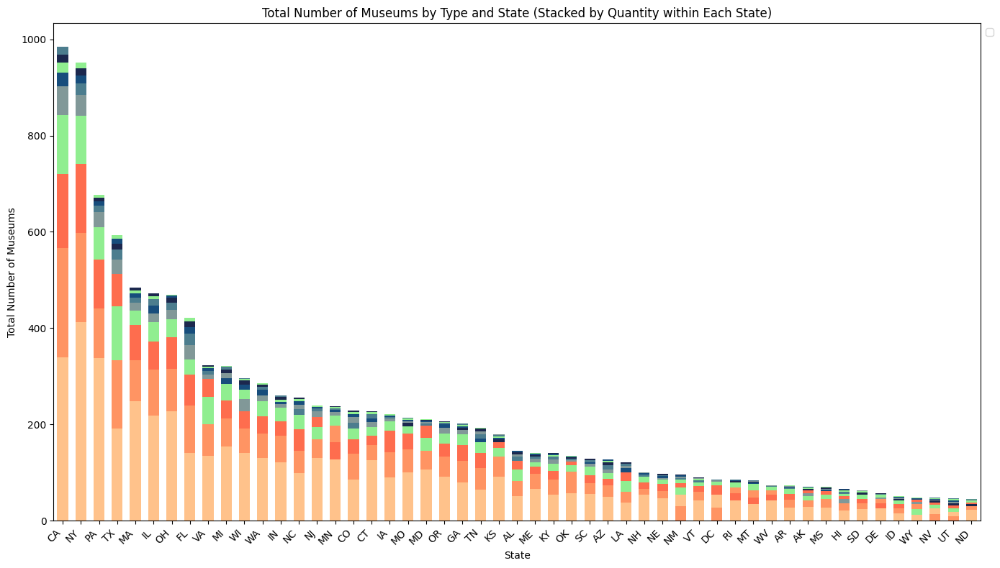

In [56]:
import pandas as pd
import matplotlib.pyplot as plt

# Color dictionary for museum types
color_dict = {
    'HISTORIC PRESERVATION': '#FFC28B',
    'GENERAL MUSEUM': '#FF9463',
    'ART MUSEUM': '#FE6D4E',
    'HISTORY MUSEUM': 'lightgreen',
    'ARBORETUM, BOTANICAL GARDEN, OR NATURE CENTER': '#819898',
    'SCIENCE & TECHNOLOGY MUSEUM OR PLANETARIUM': '#4C7D8E',
    'CHILDREN\'S MUSEUM': '#174D7C',
    'ZOO, AQUARIUM, OR WILDLIFE CONSERVATION': '#1C284E',
    'NATURAL HISTORY MUSEUM': 'lightgreen',
}

# Assuming museums_df is your DataFrame with museum data

# Step 1: Create a count of museums by type and state
museum_counts = museums_df.groupby(['State (Administrative Location)', 'Museum Type']).size().unstack(fill_value=0)

# Step 2: Calculate total counts for each state and sort states by total counts
state_totals = museum_counts.sum(axis=1).sort_values(ascending=False)

# Step 3: Reorder the museum_counts DataFrame based on the sorted states
sorted_museum_counts = museum_counts.loc[state_totals.index]

# Step 4: Create a figure for the stacked bar chart
plt.figure(figsize=(14, 8))  # Adjust figure size if needed

# Plot each state's bars individually
bar_width = 0.6  # Adjust bar width for spacing
for idx, state in enumerate(sorted_museum_counts.index):
    counts = sorted_museum_counts.loc[state]
    # Sort the counts in descending order for this state
    ordered_counts = counts.sort_values(ascending=False)
    
    # Plot the bars with appropriate colors
    # Use 'bottom' to stack bars correctly
    bottom = 0
    for museum_type in ordered_counts.index:
        plt.bar(idx, ordered_counts[museum_type], color=color_dict.get(museum_type, 'gray'), bottom=bottom, width=bar_width)
        bottom += ordered_counts[museum_type]

# Adjust the x-ticks to show state names
plt.xticks(ticks=range(len(sorted_museum_counts.index)), labels=sorted_museum_counts.index, rotation=45, ha='right')

# Create a legend with unique labels
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='upper left', bbox_to_anchor=(1, 1))

# Customize bar chart
plt.title('Total Number of Museums by Type and State (Stacked by Quantity within Each State)')
plt.xlabel('State')
plt.ylabel('Total Number of Museums')

# Add some padding to the x-axis limits for better spacing
plt.xlim(-0.5, len(sorted_museum_counts.index) - 0.5)

# Show the plot
plt.tight_layout()
plt.show()


In [65]:
import pandas as pd

# Load the museum data
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Display the column names
print(museums_df.columns)
museums_df.head


Index(['Museum ID', 'Museum Name', 'Legal Name', 'Alternate Name',
       'Museum Type', 'Institution Name',
       'Street Address (Administrative Location)',
       'City (Administrative Location)', 'State (Administrative Location)',
       'Zip Code (Administrative Location)',
       'Street Address (Physical Location)', 'City (Physical Location)',
       'State (Physical Location)', 'Zip Code (Physical Location)',
       'Phone Number', 'Latitude', 'Longitude', 'Locale Code (NCES)',
       'County Code (FIPS)', 'State Code (FIPS)', 'Region Code (AAM)',
       'Employer ID Number', 'Tax Period', 'Income', 'Revenue'],
      dtype='object')


<bound method NDFrame.head of         Museum ID                                        Museum Name  \
0      8400200098                    ALASKA AVIATION HERITAGE MUSEUM   
1      8400200117                            ALASKA BOTANICAL GARDEN   
2      8400200153  ALASKA CHALLENGER CENTER FOR SPACE SCIENCE TEC...   
3      8400200143                ALASKA EDUCATORS HISTORICAL SOCIETY   
4      8400200027                             ALASKA HERITAGE MUSEUM   
...           ...                                                ...   
33067  8405600184                   WYOMING STATE HISTORICAL SOCIETY   
33068  8405600061                               WYOMING STATE MUSEUM   
33069  8405600158      WYOMING TERRITORIAL PARK HISTORIC ASSOCIATION   
33070  8405600137                      WYOMING TRANSPORTATION MUSEUM   
33071  8405600199                          YELLOWSTONE NATIONAL PARK   

                                              Legal Name Alternate Name  \
0                        ALASK

In [90]:
import pandas as pd

# Adjust display settings to show all rows
pd.set_option('display.max_rows', None)

# Load the museum data
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Use the correct column name for ZIP code
zip_column_name = 'Zip Code (Administrative Location)'

# Ensure ZIP codes are strings and of consistent length
museums_df[zip_column_name] = museums_df[zip_column_name].astype(str).str.zfill(5)

# Aggregate the number of museums per ZIP code
museums_per_zip = museums_df[zip_column_name].value_counts().reset_index()
museums_per_zip.columns = ['ZipCode', 'MuseumCount']

# Print the museum counts for ZIP codes in Montana (assuming ZIP codes starting with '59')
montana_museums = museums_per_zip[museums_per_zip['ZipCode'].str.startswith('59')]
print(montana_museums)


      ZipCode  MuseumCount
175     59101           10
261     59715            9
380     59601            8
557     59701            7
580     59047            7
633     59034            6
709     59802            6
918     59812            5
985     59901            5
991     59401            5
995     59725            5
996     59068            5
1559    59806            4
1563    59755            4
1603    59703            4
1614    59102            4
1618    59602            4
1632    59457            4
1636    59717            4
1639    59501            4
1640    59758            4
1644    59858            4
1646    59330            4
1652    59860            4
1658    59718            4
3558    59808            3
3560    59722            3
3597    59870            3
3600    59103            3
3606    59301            3
3631    59840            3
3632    59230            3
3679    59937            3
5136    59425            2
5137    59636            2
5138    59824            2
5

In [91]:
import pandas as pd

# Adjust display settings to show all rows
pd.set_option('display.max_rows', None)

# Load the museum data
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Use the correct column name for ZIP code
zip_column_name = 'Zip Code (Administrative Location)'

# Ensure ZIP codes are strings and of consistent length
museums_df[zip_column_name] = museums_df[zip_column_name].astype(str).str.zfill(5)

# Aggregate the number of museums per ZIP code
museums_per_zip = museums_df[zip_column_name].value_counts().reset_index()
museums_per_zip.columns = ['ZipCode', 'MuseumCount']

# Print the museum counts for ZIP codes in New Jersey (assuming ZIP codes starting with '07', '08', or '09')
new_jersey_museums = museums_per_zip[museums_per_zip['ZipCode'].str.startswith(('07', '08', '09'))]
print(new_jersey_museums)


      ZipCode  MuseumCount
147     08901           11
168     07102           10
194     07960           10
268     08204            9
350     08540            8
352     08060            8
369     07940            8
452     07302            7
538     08876            7
615     08608            6
665     07078            6
666     08103            6
680     07470            6
866     08809            5
867     08807            5
884     08873            5
892     08701            5
895     08028            5
910     07060            5
1066    08016            5
1074    08244            5
1076    08401            5
1077    08037            5
1835    07860            4
1837    07649            4
1847    07840            4
1887    08088            4
1908    07052            4
1922    07016            4
1933    07728            4
1940    07901            4
1941    08302            4
1967    08822            4
1980    08742            4
1986    08003            4
1988    08087            4
2

/var/folders/5q/z1l12s4n7y1bxgmlhw1vkr7c0000gp/T/ipykernel_13413/1860948964.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('YlGnBu')


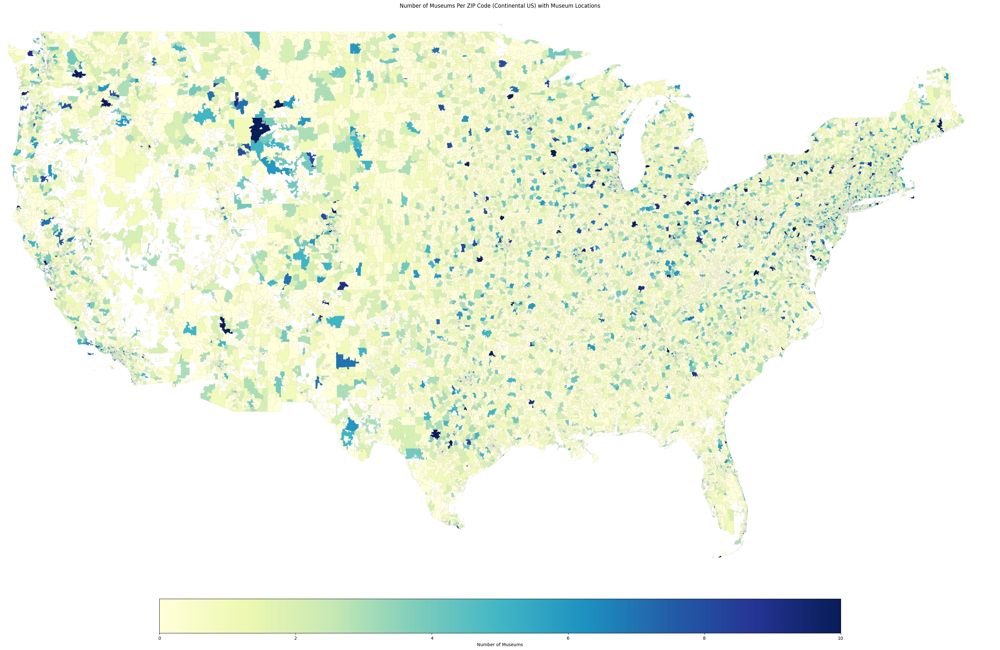

In [99]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load the museum data
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Use the correct column name for ZIP code
zip_column_name = 'Zip Code (Administrative Location)'

# Ensure ZIP codes are strings and of consistent length
museums_df[zip_column_name] = museums_df[zip_column_name].astype(str).str.zfill(5)

# Aggregate the number of museums per ZIP code
museums_per_zip = museums_df[zip_column_name].value_counts().reset_index()
museums_per_zip.columns = ['ZipCode', 'MuseumCount']

# Load the ZIP code shapefile (update the path to where your shapefile is located)
zip_shapefile_path = 'cb_2018_us_zcta510_500k.shp'
zip_gdf = gpd.read_file(zip_shapefile_path)

# Ensure ZIP codes in shapefile are strings and of consistent length
zip_gdf['ZCTA5CE10'] = zip_gdf['ZCTA5CE10'].astype(str).str.zfill(5)

# Merge the museum counts with the ZIP code geometrical data
merged_zip_gdf = zip_gdf.merge(museums_per_zip, left_on='ZCTA5CE10', right_on='ZipCode', how='left')
merged_zip_gdf['MuseumCount'] = merged_zip_gdf['MuseumCount'].fillna(0)

# Create a custom colormap with white for zero and varying shades of blue for 1 to 10+ museums
cmap = plt.cm.get_cmap('YlGnBu')

# Set the figure size to make the map balanced
fig, ax = plt.subplots(1, 1, figsize=(40, 30), subplot_kw={'projection': ccrs.PlateCarree()})

# Apply a linear scale for the museum count data
norm = mcolors.Normalize(vmin=0, vmax=10)

# Plot the merged GeoDataFrame for the heatmap
merged_zip_gdf.plot(column='MuseumCount', cmap=cmap, linewidth=0.2, ax=ax, edgecolor='0.8', norm=norm, zorder=1)

# Plot museum locations with red dots

# Adjust aspect ratio to stretch or squash the map vertically
aspect_ratio = 1.3
ax.set_aspect(aspect_ratio)

# Set the extent (geographical bounds) for the map
ax.set_extent([-125, -65, 24, 50], crs=ccrs.PlateCarree())

# Remove axes for a cleaner look
ax.axis('off')

# Add a title and colorbar
plt.title('Number of Museums Per ZIP Code (Continental US) with Museum Locations')
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='horizontal', fraction=0.046, pad=0.04)
cbar.set_label('Number of Museums')

# Show the plot
plt.show()


/var/folders/5q/z1l12s4n7y1bxgmlhw1vkr7c0000gp/T/ipykernel_13413/997686512.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('YlGnBu', 10)


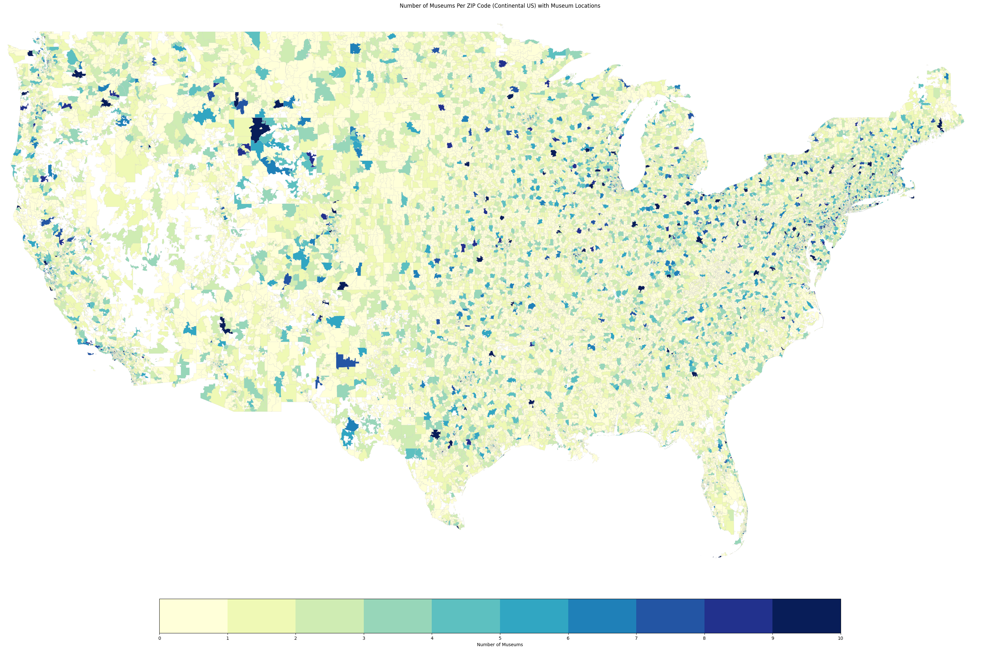

In [108]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load the museum data
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Use the correct column name for ZIP code
zip_column_name = 'Zip Code (Administrative Location)'

# Ensure ZIP codes are strings and of consistent length
museums_df[zip_column_name] = museums_df[zip_column_name].astype(str).str.zfill(5)

# Aggregate the number of museums per ZIP code
museums_per_zip = museums_df[zip_column_name].value_counts().reset_index()
museums_per_zip.columns = ['ZipCode', 'MuseumCount']

# Load the ZIP code shapefile (update the path to where your shapefile is located)
zip_shapefile_path = 'cb_2018_us_zcta510_500k.shp'
zip_gdf = gpd.read_file(zip_shapefile_path)

# Ensure ZIP codes in shapefile are strings and of consistent length
zip_gdf['ZCTA5CE10'] = zip_gdf['ZCTA5CE10'].astype(str).str.zfill(5)

# Merge the museum counts with the ZIP code geometrical data
merged_zip_gdf = zip_gdf.merge(museums_per_zip, left_on='ZCTA5CE10', right_on='ZipCode', how='left')
merged_zip_gdf['MuseumCount'] = merged_zip_gdf['MuseumCount'].fillna(0)

# Create a custom colormap with exactly 10 colors
cmap = plt.cm.get_cmap('YlGnBu', 10)

# Set the figure size to make the map balanced
fig, ax = plt.subplots(1, 1, figsize=(40, 30), subplot_kw={'projection': ccrs.PlateCarree()})

# Apply a linear scale for the museum count data
norm = mcolors.BoundaryNorm(boundaries=range(11), ncolors=10)

# Plot the merged GeoDataFrame for the heatmap
merged_zip_gdf.plot(column='MuseumCount', cmap=cmap, linewidth=0.2, ax=ax, edgecolor='0.8', norm=norm, zorder=1)


# Adjust aspect ratio to stretch or squash the map vertically
aspect_ratio = 1.3
ax.set_aspect(aspect_ratio)

# Set the extent (geographical bounds) for the map
ax.set_extent([-125, -65, 24, 50], crs=ccrs.PlateCarree())

# Remove axes for a cleaner look
ax.axis('off')

# Add a title and colorbar
plt.title('Number of Museums Per ZIP Code (Continental US) with Museum Locations')
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='horizontal', fraction=0.046, pad=0.04, boundaries=range(11), ticks=range(11))
cbar.set_label('Number of Museums')

# Show the plot
plt.show()


In [138]:
import pandas as pd

# Load the museum data
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Use the correct column name for state
state_column_name = 'State (Administrative Location)'

# Aggregate the number of museums per state
museums_per_state = museums_df[state_column_name].value_counts().reset_index()
museums_per_state.columns = ['State', 'MuseumCount']

# Create a dictionary to store museum counts
museum_counts_dict = museums_per_state.set_index('State')['MuseumCount'].to_dict()

# Print the dictionary to verify
print(museum_counts_dict)


{'CA': 2670, 'NY': 2239, 'TX': 1886, 'PA': 1653, 'OH': 1363, 'IL': 1310, 'FL': 1149, 'MI': 1039, 'MA': 1028, 'VA': 958, 'WI': 887, 'NC': 779, 'NJ': 756, 'MO': 742, 'WA': 721, 'IN': 685, 'MN': 681, 'GA': 668, 'IA': 661, 'CO': 649, 'MD': 618, 'TN': 559, 'OR': 550, 'OK': 547, 'CT': 544, 'KS': 537, 'ME': 521, 'KY': 466, 'AL': 463, 'AZ': 449, 'LA': 395, 'SC': 391, 'NH': 363, 'NE': 347, 'NM': 320, 'AR': 317, 'VT': 292, 'MT': 270, 'ND': 269, 'WV': 258, 'MS': 247, 'SD': 234, 'ID': 214, 'WY': 192, 'DC': 190, 'RI': 181, 'HI': 176, 'NV': 174, 'UT': 170, 'AK': 162, 'DE': 132}


In [137]:
# Load the population data
population_data_path = 'NST-EST2023-POPCHG2020_2023.csv'
population_df = pd.read_csv(population_data_path)

# Rename columns to match the expected structure
population_df = population_df.rename(columns={'NAME': 'State', 'POPESTIMATE2023': 'Population'})

# Map state full names to abbreviations
state_full_to_abbreviation = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA',
    'Colorado': 'CO', 'Connecticut': 'CT', 'Delaware': 'DE', 'Florida': 'FL', 'Georgia': 'GA',
    'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA',
    'Kansas': 'KS', 'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD',
    'Massachusetts': 'MA', 'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS', 'Missouri': 'MO',
    'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH', 'New Jersey': 'NJ',
    'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC', 'North Dakota': 'ND', 'Ohio': 'OH',
    'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI', 'South Carolina': 'SC',
    'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX', 'Utah': 'UT', 'Vermont': 'VT',
    'Virginia': 'VA', 'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'
}

# Filter the DataFrame to include only valid states
population_df = population_df[population_df['State'].isin(state_full_to_abbreviation.keys())]

# Create the population dictionary with state abbreviations
population_dict = population_df.set_index(population_df['State'].map(state_full_to_abbreviation))['Population'].to_dict()

# Print the dictionary to verify
print(population_dict)


{'AL': 5108468, 'AK': 733406, 'AZ': 7431344, 'AR': 3067732, 'CA': 38965193, 'CO': 5877610, 'CT': 3617176, 'DE': 1031890, 'FL': 22610726, 'GA': 11029227, 'HI': 1435138, 'ID': 1964726, 'IL': 12549689, 'IN': 6862199, 'IA': 3207004, 'KS': 2940546, 'KY': 4526154, 'LA': 4573749, 'ME': 1395722, 'MD': 6180253, 'MA': 7001399, 'MI': 10037261, 'MN': 5737915, 'MS': 2939690, 'MO': 6196156, 'MT': 1132812, 'NE': 1978379, 'NV': 3194176, 'NH': 1402054, 'NJ': 9290841, 'NM': 2114371, 'NY': 19571216, 'NC': 10835491, 'ND': 783926, 'OH': 11785935, 'OK': 4053824, 'OR': 4233358, 'PA': 12961683, 'RI': 1095962, 'SC': 5373555, 'SD': 919318, 'TN': 7126489, 'TX': 30503301, 'UT': 3417734, 'VT': 647464, 'VA': 8715698, 'WA': 7812880, 'WV': 1770071, 'WI': 5910955, 'WY': 584057}


In [142]:
import pandas as pd

# Load the museum data
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Use the correct column name for state
state_column_name = 'State (Administrative Location)'

# Aggregate the number of museums per state
museums_per_state = museums_df[state_column_name].value_counts().reset_index()
museums_per_state.columns = ['State', 'MuseumCount']

# Create a dictionary to store museum counts
museum_counts_dict = museums_per_state.set_index('State')['MuseumCount'].to_dict()

# Print the dictionary to verify
print(museum_counts_dict)

# Load the population data
population_data_path = 'NST-EST2023-POPCHG2020_2023.csv'
population_df = pd.read_csv(population_data_path)

# Rename columns to match the expected structure
population_df = population_df.rename(columns={'NAME': 'State', 'POPESTIMATE2023': 'Population'})

# Map state full names to abbreviations
state_full_to_abbreviation = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA',
    'Colorado': 'CO', 'Connecticut': 'CT', 'Delaware': 'DE', 'Florida': 'FL', 'Georgia': 'GA',
    'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA',
    'Kansas': 'KS', 'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD',
    'Massachusetts': 'MA', 'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS', 'Missouri': 'MO',
    'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH', 'New Jersey': 'NJ',
    'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC', 'North Dakota': 'ND', 'Ohio': 'OH',
    'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI', 'South Carolina': 'SC',
    'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX', 'Utah': 'UT', 'Vermont': 'VT',
    'Virginia': 'VA', 'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY',
    'District of Columbia': 'DC'
}

# Filter the DataFrame to include only valid states
population_df = population_df[population_df['State'].isin(state_full_to_abbreviation.keys())]

# Create the population dictionary with state abbreviations
population_dict = population_df.set_index(population_df['State'].map(state_full_to_abbreviation))['Population'].to_dict()

# Print the dictionary to verify
print(population_dict)


{'CA': 2670, 'NY': 2239, 'TX': 1886, 'PA': 1653, 'OH': 1363, 'IL': 1310, 'FL': 1149, 'MI': 1039, 'MA': 1028, 'VA': 958, 'WI': 887, 'NC': 779, 'NJ': 756, 'MO': 742, 'WA': 721, 'IN': 685, 'MN': 681, 'GA': 668, 'IA': 661, 'CO': 649, 'MD': 618, 'TN': 559, 'OR': 550, 'OK': 547, 'CT': 544, 'KS': 537, 'ME': 521, 'KY': 466, 'AL': 463, 'AZ': 449, 'LA': 395, 'SC': 391, 'NH': 363, 'NE': 347, 'NM': 320, 'AR': 317, 'VT': 292, 'MT': 270, 'ND': 269, 'WV': 258, 'MS': 247, 'SD': 234, 'ID': 214, 'WY': 192, 'DC': 190, 'RI': 181, 'HI': 176, 'NV': 174, 'UT': 170, 'AK': 162, 'DE': 132}
{'AL': 5108468, 'AK': 733406, 'AZ': 7431344, 'AR': 3067732, 'CA': 38965193, 'CO': 5877610, 'CT': 3617176, 'DE': 1031890, 'DC': 678972, 'FL': 22610726, 'GA': 11029227, 'HI': 1435138, 'ID': 1964726, 'IL': 12549689, 'IN': 6862199, 'IA': 3207004, 'KS': 2940546, 'KY': 4526154, 'LA': 4573749, 'ME': 1395722, 'MD': 6180253, 'MA': 7001399, 'MI': 10037261, 'MN': 5737915, 'MS': 2939690, 'MO': 6196156, 'MT': 1132812, 'NE': 1978379, 'NV':

In [147]:
# Sort both dictionaries by state abbreviation
sorted_museum_counts = dict(sorted(museum_counts_dict.items()))
sorted_population = dict(sorted(population_dict.items()))

# Calculate the number of people per museum and create a new dictionary
people_per_museum_dict = {
    state: round(sorted_population[state] / museum_counts)
    for state, museum_counts in sorted_museum_counts.items()
    if state in sorted_population and museum_counts > 0
}

# Sort the dictionary by the number of people per museum
sorted_people_per_museum = dict(sorted(people_per_museum_dict.items(), key=lambda item: item[1]))

# Print the results in rows
for state, ratio in sorted_people_per_museum.items():
    print(f"{state}: 1/{ratio}")


VT: 1/2217
ME: 1/2679
ND: 1/2914
WY: 1/3042
DC: 1/3574
NH: 1/3862
SD: 1/3929
MT: 1/4196
AK: 1/4527
IA: 1/4852
KS: 1/5476
NE: 1/5701
RI: 1/6055
NM: 1/6607
CT: 1/6649
WI: 1/6664
MA: 1/6811
WV: 1/6861
OK: 1/7411
OR: 1/7697
DE: 1/7817
PA: 1/7841
HI: 1/8154
MO: 1/8351
MN: 1/8426
OH: 1/8647
NY: 1/8741
CO: 1/9056
VA: 1/9098
ID: 1/9181
IL: 1/9580
MI: 1/9661
AR: 1/9677
KY: 1/9713
MD: 1/10000
IN: 1/10018
WA: 1/10836
AL: 1/11033
LA: 1/11579
MS: 1/11902
NJ: 1/12289
TN: 1/12749
SC: 1/13743
NC: 1/13909
CA: 1/14594
TX: 1/16174
GA: 1/16511
AZ: 1/16551
NV: 1/18357
FL: 1/19679
UT: 1/20104


In [148]:
import pandas as pd

# Load the dataset
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Assuming the dataset has a column that specifies the type of museum, e.g., 'Type'
# Replace 'Type' with the actual column name if different

# Filter for zoos and aquariums and count them
total_zoos = museums_df[museums_df['Type'].str.contains('Zoo', case=False, na=False)].shape[0]
total_aquariums = museums_df[museums_df['Type'].str.contains('Aquarium', case=False, na=False)].shape[0]

# Print the results
print(f"Total number of zoos in the US: {total_zoos}")
print(f"Total number of aquariums in the US: {total_aquariums}")


KeyError: 'Type'

In [149]:
import pandas as pd

# Load the dataset
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Print the columns to find the correct one
print(museums_df.columns)

Index(['Museum ID', 'Museum Name', 'Legal Name', 'Alternate Name',
       'Museum Type', 'Institution Name',
       'Street Address (Administrative Location)',
       'City (Administrative Location)', 'State (Administrative Location)',
       'Zip Code (Administrative Location)',
       'Street Address (Physical Location)', 'City (Physical Location)',
       'State (Physical Location)', 'Zip Code (Physical Location)',
       'Phone Number', 'Latitude', 'Longitude', 'Locale Code (NCES)',
       'County Code (FIPS)', 'State Code (FIPS)', 'Region Code (AAM)',
       'Employer ID Number', 'Tax Period', 'Income', 'Revenue'],
      dtype='object')


In [152]:
import pandas as pd

# Load the dataset
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Display distinct values in the 'Museum Type' column to understand its contents
print(museums_df['Museum Type'].unique())

# Filter for zoos and aquariums and display a sample of the data to verify correctness
zoos_df = museums_df[museums_df['Museum Type'].str.contains('Zoo', case=False, na=False)]
aquariums_df = museums_df[museums_df['Museum Type'].str.contains('Aquarium', case=False, na=False)]

# Display samples
print(zoos_df.head())
print(aquariums_df.head())

# Count the total number of unique zoos and aquariums
total_zoos = zoos_df['Museum ID'].nunique()
total_aquariums = aquariums_df['Museum ID'].nunique()

# Print the results
print(f"Total number of zoos in the US: {total_zoos}")
print(f"Total number of aquariums in the US: {total_aquariums}")


['HISTORY MUSEUM' 'ARBORETUM, BOTANICAL GARDEN, OR NATURE CENTER'
 'SCIENCE & TECHNOLOGY MUSEUM OR PLANETARIUM' 'HISTORIC PRESERVATION'
 'GENERAL MUSEUM' 'ZOO, AQUARIUM, OR WILDLIFE CONSERVATION' 'ART MUSEUM'
 "CHILDREN'S MUSEUM" 'NATURAL HISTORY MUSEUM']
      Museum ID                                        Museum Name  \
12   8409500006                              ALASKA SEALIFE CENTER   
19   8400200087                                         ALASKA ZOO   
109  8400200167                                       OCEANSALASKA   
125  8400200126  SEWARD ASSOCIATION FOR THE ADVANCEMENT OF MARI...   
205  8400100279                            ALABAMA WILDLIFE CENTER   

                                            Legal Name Alternate Name  \
12                               ALASKA SEALIFE CENTER            NaN   
19                                          ALASKA ZOO            NaN   
109                                       OCEANSALASKA            NaN   
125  SEWARD ASSOCIATION FOR THE

In [151]:
import pandas as pd

# Load the dataset
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Filter for zoos and aquariums and count them using the 'Museum Type' column
total_zoos = museums_df[museums_df['Museum Type'].str.contains('Zoo', case=False, na=False)].shape[0]
total_aquariums = museums_df[museums_df['Museum Type'].str.contains('Aquarium', case=False, na=False)].shape[0]

# Print the results
print(f"Total number of zoos in the US: {total_zoos}")
print(f"Total number of aquariums in the US: {total_aquariums}")


Total number of zoos in the US: 564
Total number of aquariums in the US: 564


In [153]:
import pandas as pd

# Load the dataset
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Filter for entries where 'Museum Type' is 'ZOO, AQUARIUM, OR WILDLIFE CONSERVATION'
zoo_aquarium_df = museums_df[museums_df['Museum Type'] == 'ZOO, AQUARIUM, OR WILDLIFE CONSERVATION']

# Further filter for zoos and aquariums based on the museum names
zoos_df = zoo_aquarium_df[zoo_aquarium_df['Museum Name'].str.contains('Zoo', case=False, na=False)]
aquariums_df = zoo_aquarium_df[zoo_aquarium_df['Museum Name'].str.contains('Aquarium', case=False, na=False)]

# Count the total number of unique zoos and aquariums
total_zoos = zoos_df['Museum ID'].nunique()
total_aquariums = aquariums_df['Museum ID'].nunique()

# Print the results
print(f"Total number of zoos in the US: {total_zoos}")
print(f"Total number of aquariums in the US: {total_aquariums}")


Total number of zoos in the US: 259
Total number of aquariums in the US: 100


In [154]:
import pandas as pd

# Load the dataset
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Filter for entries where 'Museum Type' is 'ZOO, AQUARIUM, OR WILDLIFE CONSERVATION'
zoo_aquarium_wildlife_df = museums_df[museums_df['Museum Type'] == 'ZOO, AQUARIUM, OR WILDLIFE CONSERVATION']

# Further filter for zoos, aquariums, and wildlife based on the museum names
zoos_df = zoo_aquarium_wildlife_df[zoo_aquarium_wildlife_df['Museum Name'].str.contains('Zoo', case=False, na=False)]
aquariums_df = zoo_aquarium_wildlife_df[zoo_aquarium_wildlife_df['Museum Name'].str.contains('Aquarium', case=False, na=False)]
wildlife_df = zoo_aquarium_wildlife_df[zoo_aquarium_wildlife_df['Museum Name'].str.contains('Wildlife', case=False, na=False)]

# Count the total number of unique zoos, aquariums, and wildlife conservation institutions
total_zoos = zoos_df['Museum ID'].nunique()
total_aquariums = aquariums_df['Museum ID'].nunique()
total_wildlife = wildlife_df['Museum ID'].nunique()

# Print the results
print(f"Total number of zoos in the US: {total_zoos}")
print(f"Total number of aquariums in the US: {total_aquariums}")
print(f"Total number of wildlife conservation institutions in the US: {total_wildlife}")
print(f"Total number of zoos, aquariums, and wildlife conservation institutions in the US: {total_zoos + total_aquariums + total_wildlife}")


Total number of zoos in the US: 259
Total number of aquariums in the US: 100
Total number of wildlife conservation institutions in the US: 59
Total number of zoos, aquariums, and wildlife conservation institutions in the US: 418


In [157]:
import pandas as pd

# Load the dataset
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Filter for entries where 'Museum Type' is 'ZOO, AQUARIUM, OR WILDLIFE CONSERVATION'
zoo_aquarium_wildlife_df = museums_df[museums_df['Museum Type'] == 'ZOO, AQUARIUM, OR WILDLIFE CONSERVATION']

# Count all entries under 'ZOO, AQUARIUM, OR WILDLIFE CONSERVATION'
total_zoo_aquarium_wildlife = zoo_aquarium_wildlife_df['Museum ID'].nunique()

# Further filter for zoos, aquariums, and wildlife based on the museum names
zoos_df = zoo_aquarium_wildlife_df[zoo_aquarium_wildlife_df['Museum Name'].str.contains('Zoo', case=False, na=False)]
aquariums_df = zoo_aquarium_wildlife_df[zoo_aquarium_wildlife_df['Museum Name'].str.contains('Aquarium', case=False, na=False)]
wildlife_df = zoo_aquarium_wildlife_df[zoo_aquarium_wildlife_df['Museum Name'].str.contains('Wildlife', case=False, na=False)]

# Count the total number of unique zoos, aquariums, and wildlife conservation institutions
total_zoos = zoos_df['Museum ID'].nunique()
total_aquariums = aquariums_df['Museum ID'].nunique()
total_wildlife = wildlife_df['Museum ID'].nunique()

# Print the results
print(f"Total number of zoos in the US: {total_zoos}")
print(f"Total number of aquariums in the US: {total_aquariums}")
print(f"Total number of wildlife conservation institutions in the US: {total_wildlife}")
print(f"Total number of zoos, aquariums, and wildlife conservation institutions in the US: {total_zoo_aquarium_wildlife}")


Total number of zoos in the US: 259
Total number of aquariums in the US: 100
Total number of wildlife conservation institutions in the US: 59
Total number of zoos, aquariums, and wildlife conservation institutions in the US: 564


In [158]:
import pandas as pd

# Load the dataset
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Identify the columns related to revenue
# Assuming the column name for last year's revenue is 'Revenue'
# and the column for museum name is 'Museum Name'

# Find the row with the maximum revenue
max_revenue_row = museums_df.loc[museums_df['Revenue'].idxmax()]

# Extract the museum name and revenue
highest_revenue_museum = max_revenue_row['Museum Name']
highest_revenue = max_revenue_row['Revenue']

# Print the results
print(f"The museum or related organization with the highest revenue last year is {highest_revenue_museum} with a revenue of ${highest_revenue}.")


The museum or related organization with the highest revenue last year is FRED LAWRENCE WHIPPLE OBSERVATORY with a revenue of $5840349457.0.


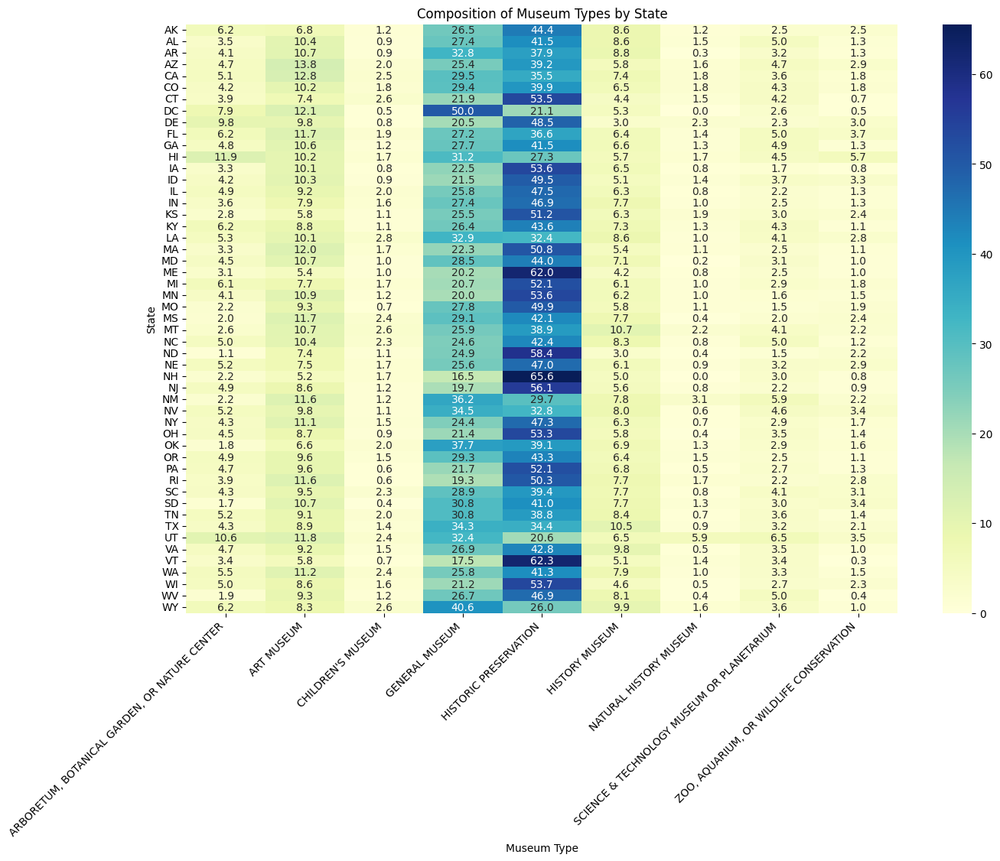

In [169]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Group the data by state and museum type, then count the occurrences
state_museum_type_counts = museums_df.groupby(['State (Administrative Location)', 'Museum Type']).size().unstack(fill_value=0)

# Normalize the counts to get the composition percentages
state_museum_type_composition = state_museum_type_counts.div(state_museum_type_counts.sum(axis=1), axis=0) * 100

# Print the composition table to see the percentages
# print(state_museum_type_composition)

# Plot the composition of museum types by state using a heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(state_museum_type_composition, cmap="YlGnBu", annot=True, fmt=".1f")
plt.title('Composition of Museum Types by State')
plt.xlabel('Museum Type')
plt.ylabel('State')
plt.xticks(rotation=45, ha='right')
plt.show()


In [160]:
import pandas as pd

# Load the dataset
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Group the data by museum type
grouped_by_type = museums_df.groupby('Museum Type')

# Compute statistical measures for revenue and income
revenue_stats = grouped_by_type['Revenue'].agg(['mean', 'median', 'std']).reset_index()
income_stats = grouped_by_type['Income'].agg(['mean', 'median', 'std']).reset_index()

# Print the results
print("Revenue Statistics by Museum Type:")
print(revenue_stats)
print("\nIncome Statistics by Museum Type:")
print(income_stats)


Revenue Statistics by Museum Type:
                                     Museum Type          mean     median  \
0  ARBORETUM, BOTANICAL GARDEN, OR NATURE CENTER  7.787922e+07   150130.5   
1                                     ART MUSEUM  1.007874e+08  1503702.0   
2                              CHILDREN'S MUSEUM  1.355364e+06   304322.0   
3                                 GENERAL MUSEUM  2.740284e+07    25487.0   
4                          HISTORIC PRESERVATION  2.035602e+06        0.0   
5                                 HISTORY MUSEUM  9.402442e+06    32602.0   
6                         NATURAL HISTORY MUSEUM  8.549832e+07   113442.0   
7     SCIENCE & TECHNOLOGY MUSEUM OR PLANETARIUM  1.143093e+08   335123.0   
8        ZOO, AQUARIUM, OR WILDLIFE CONSERVATION  5.483602e+06   329603.5   

            std  
0  5.384317e+08  
1  4.226339e+08  
2  3.781062e+06  
3  3.146240e+08  
4  9.022186e+07  
5  1.662101e+08  
6  5.594769e+08  
7  6.617205e+08  
8  1.405838e+07  

Income Statis

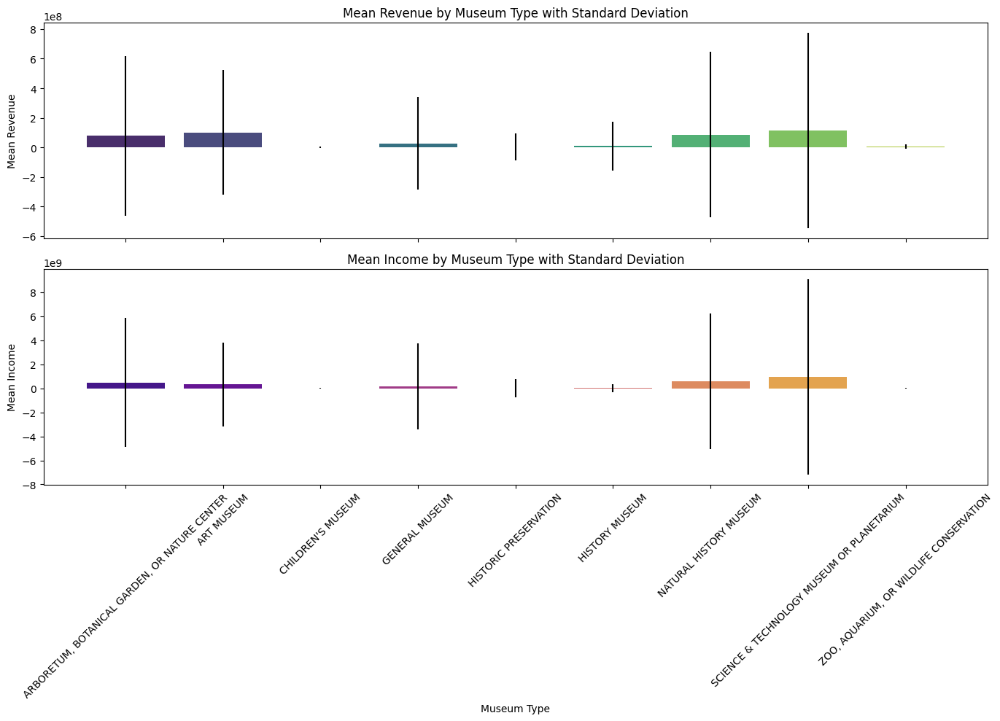

In [173]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
museums_df = pd.read_csv('museums.csv', low_memory=False)

# Group the data by museum type and calculate mean and standard deviation for revenue and income
revenue_stats = museums_df.groupby('Museum Type')['Revenue'].agg(['mean', 'std']).reset_index()
income_stats = museums_df.groupby('Museum Type')['Income'].agg(['mean', 'std']).reset_index()

# Set up the figure and axes
fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# Bar plot for Revenue by Museum Type
sns.barplot(x='Museum Type', y='mean', data=revenue_stats, palette='viridis', ax=axes[0], errorbar=None, hue='Museum Type', dodge=False)
axes[0].errorbar(revenue_stats['Museum Type'], revenue_stats['mean'], yerr=revenue_stats['std'], fmt='none', c='black')
axes[0].set_title('Mean Revenue by Museum Type with Standard Deviation')
axes[0].set_xlabel('Museum Type')
axes[0].set_ylabel('Mean Revenue')
axes[0].legend([], [], frameon=False)  # Hide the legend
axes[0].tick_params(axis='x', rotation=45)

# Bar plot for Income by Museum Type
sns.barplot(x='Museum Type', y='mean', data=income_stats, palette='plasma', ax=axes[1], errorbar=None, hue='Museum Type', dodge=False)
axes[1].errorbar(income_stats['Museum Type'], income_stats['mean'], yerr=income_stats['std'], fmt='none', c='black')
axes[1].set_title('Mean Income by Museum Type with Standard Deviation')
axes[1].set_xlabel('Museum Type')
axes[1].set_ylabel('Mean Income')
axes[1].legend([], [], frameon=False)  # Hide the legend
axes[1].tick_params(axis='x', rotation=45)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()


In [1]:
! git status


On branch main
Your branch is up to date with 'origin/main'.

Changes not staged for commit:
  (use "git add <file>..." to update what will be committed)
  (use "git restore <file>..." to discard changes in working directory)
	modified:   README.md

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	.DS_Store
	.jupyter/
	NST-EST2023-ALLDATA.csv
	NST-EST2023-POPCHG2020_2023.csv
	Natural_Earth_quick_start/
	Population-Rivers-Museums.ipynb
	cb_2018_us_state_20m.dbf
	cb_2018_us_state_20m.shp
	cb_2018_us_state_20m.shx
	cb_2018_us_zcta510_500k.dbf
	cb_2018_us_zcta510_500k.shp
	cb_2018_us_zcta510_500k.shx

no changes added to commit (use "git add" and/or "git commit -a")


In [2]:
! git add .

In [3]:
! git commit -m "Multiple charts and results for museum data"

[main 461032b] Multiple charts and results for museum data
 Committer: Peter <peter@Zipcoders-MacBook-Pro-6.local>
Your name and email address were configured automatically based
on your username and hostname. Please check that they are accurate.
You can suppress this message by setting them explicitly:

    git config --global user.name "Your Name"
    git config --global user.email you@example.com

After doing this, you may fix the identity used for this commit with:

    git commit --amend --reset-author

 653 files changed, 752718 insertions(+), 1 deletion(-)
 create mode 100644 .DS_Store
 create mode 100644 .jupyter/desktop-workspaces/default-37a8.jupyterlab-workspace
 create mode 100644 NST-EST2023-ALLDATA.csv
 create mode 100644 NST-EST2023-POPCHG2020_2023.csv
 create mode 100644 Natural_Earth_quick_start/.DS_Store
 create mode 100644 Natural_Earth_quick_start/10m_cultural/.DS_Store
 create mode 100644 Natural_Earth_quick_start/10m_cultural/ne_10m_admin_0_boundary_lines_disputed

In [4]:
! git push

Enumerating objects: 376, done.
Counting objects: 100% (376/376), done.
Delta compression using up to 8 threads
Compressing objects: 100% (363/363), done.
Writing objects: 100% (374/374), 261.76 MiB | 5.16 MiB/s, done.
Total 374 (delta 139), reused 0 (delta 0), pack-reused 0
remote: Resolving deltas: 100% (139/139), completed with 1 local object.
remote: warning: File cb_2018_us_zcta510_500k.shp is 86.85 MB; this is larger than GitHub's recommended maximum file size of 50.00 MB
remote: error: Trace: 0ec4a871e0897ef00ead4a2ebbf62bbc5e59d66ff1ba101f58a43569f030ad76
remote: error: See https://gh.io/lfs for more information.
remote: error: File Natural_Earth_quick_start/50m_raster/NE1_50M_SR_W/NE1_50M_SR_W.tif is 166.93 MB; this exceeds GitHub's file size limit of 100.00 MB
remote: error: GH001: Large files detected. You may want to try Git Large File Storage - https://git-lfs.github.com.
To https://github.com/PeterVanBeever/FirstJupyterNotebook.git
 ! [remote rejected] main -> main (pre-r